In [21]:
import scanpy as sc
import scvelo as scv
raw_data_path='/data1/zzhou/pseudotime/scPN/data/DentateGyrus.loom'
adata=sc.read_loom(raw_data_path,sparse=True)
import numpy as np
np.bool=np.bool_
np.int=np.int_
np.object = object
import scvelo as scv
import scanpy as sc
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo')  # for beautified visualization
scv.set_figure_params()

# adata_=adata[adata.obs['ClusterName'].isin(['CA','CA1_Sub','CA2-3-4','Granule','Nbl1','Nbl2','nIPC','RadialGlia','GlialProg','OPC','ImmAstro'])]
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)


Running scvelo 0.2.5 (python 3.9.12) on 2024-08-09 17:25.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
DEPRECATION: Python 3.5 reached the end of its life on September 13th, 2020. Please upgrade your Python as Python 3.5 is no longer maintained. pip 21.0 will drop support for Python 3.5 in January 2021. pip 21.0 will remove support for this functionality.
ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/an

Filtered out 18710 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:04) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [26]:
sc.tl.umap(adata)

In [27]:
adata_3000=sc.pp.subsample(adata, fraction=None, n_obs=3000, random_state=0, copy=True)

/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(values):


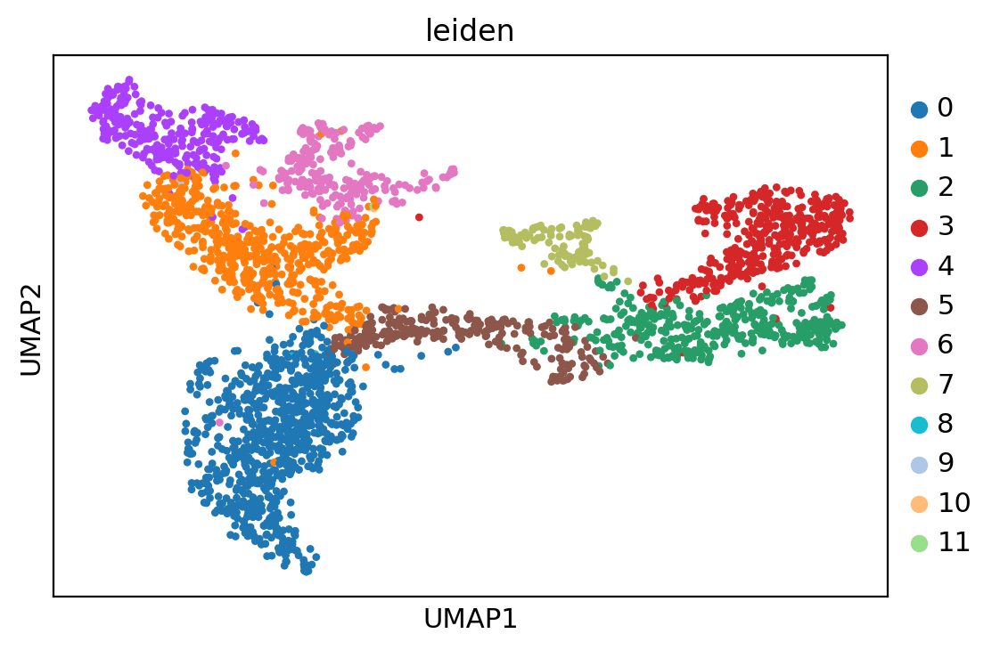

In [29]:
sc.tl.leiden(adata_3000, resolution=0.1)
sc.pl.umap(adata_3000,color='leiden')

In [30]:
adata_3000.write('/data1/zzhou/pseudotime/scPN/data/adata3000_imputed_leiden11_ID.h5ad')

In [ ]:
import scanpy as sc
import numpy as np
data_path='/data1/zzhou/pseudotime/scPN/data/adata3000_imputed_leiden11_ID.h5ad'
gene_path='/data1/zzhou/pseudotime/scPN/data/ChEA_2016.txt'
adata=sc.read(data_path)
gene_names = list(adata.var_names)
target_idx=np.zeros((len(gene_names),len(gene_names)))
gene_names= [name.upper() for name in gene_names]
with open(gene_path, "r") as f:
     for line in f.readlines():
         line = line.strip('\n')
         line = line.split('\t')
         TF_info = line[0]
         TF_name = TF_info.split(' ')[0]
         if not TF_name in gene_names:
            continue
         targets= line[2:]
         for target in targets:
             if target in gene_names:
                target_idx[gene_names.index(TF_name),gene_names.index(target)]=1

In [32]:
#preprocess
import scanpy as sc
import scvelo as scv
raw_data_path='/data1/zzhou/pseudotime/scPN/data/DentateGyrus.loom'
adata=sc.read_loom(raw_data_path,sparse=True)
import numpy as np
np.bool=np.bool_
np.int=np.int_
np.object = object
import scvelo as scv
import scanpy as sc
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo')  # for beautified visualization
scv.set_figure_params()

# adata_=adata[adata.obs['ClusterName'].isin(['CA','CA1_Sub','CA2-3-4','Granule','Nbl1','Nbl2','nIPC','RadialGlia','GlialProg','OPC','ImmAstro'])]
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
sc.tl.umap(adata)
adata_3000=sc.pp.subsample(adata, fraction=None, n_obs=3000, random_state=0, copy=True)
sc.tl.leiden(adata_3000, resolution=0.1)
adata_3000.write('/data1/zzhou/pseudotime/scPN/data/adata3000_imputed_leiden11_ID.h5ad')
#add gene matrix
data_path='/data1/zzhou/pseudotime/scPN/data/adata3000_imputed_leiden11_ID.h5ad'
gene_path='/data1/zzhou/pseudotime/scPN/data/ChEA_2016.txt'
adata=sc.read(data_path)
gene_names = list(adata.var_names)
target_idx=np.zeros((len(gene_names),len(gene_names)))
gene_names= [name.upper() for name in gene_names]
with open(gene_path, "r") as f:
     for line in f.readlines():
         line = line.strip('\n')
         line = line.split('\t')
         TF_info = line[0]
         TF_name = TF_info.split(' ')[0]
         if not TF_name in gene_names:
            continue
         targets= line[2:]
         for target in targets:
             if target in gene_names:
                target_idx[gene_names.index(TF_name),gene_names.index(target)]=1

Running scvelo 0.2.5 (python 3.9.12) on 2024-08-09 20:04.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
DEPRECATION: Python 3.5 reached the end of its life on September 13th, 2020. Please upgrade your Python as Python 3.5 is no longer maintained. pip 21.0 will drop support for Python 3.5 in January 2021. pip 21.0 will remove support for this functionality.
ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/an

Filtered out 18710 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:04) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [7]:
import scanpy as sc
adata_file='/data1/zzhou/pseudotime/scPN/data/adata3000_imputed_leiden11_ID.h5ad'
adata = sc.read(adata_file)
adata_0 = adata[adata.obs['leiden'] == '0'].X
adata_0

<839x2000 sparse matrix of type '<class 'numpy.float32'>'
	with 211017 stored elements in Compressed Sparse Row format>

In [11]:
data_path='/data1/zzhou/pseudotime/scPN/data/oligo_lite.h5ad'
adata=sc.read(data_path)
adata

AnnData object with n_obs × n_vars = 6253 × 27998
    obs: 'Age', 'Cell_Conc', 'ChipID', 'Clusters', 'Comments', 'Date_Captured', 'DonorID', 'Label', 'NGI_PlateWell', 'Num_Pooled_Animals', 'PCR_Cycles', 'Plug_Date', 'Project', 'SampleID', 'SampleOK', 'Sample_Index', 'Seq_Comment', 'Seq_Lib_Date', 'Seq_Lib_Ok', 'Serial_Number', 'Sex', 'Species', 'Strain', 'Target_Num_Cells', 'Tissue', 'Transcriptome', '_X', '_Y', 'cDNA_Lib_Ok', 'ngperul_cDNA', 'V1', 'V2', 'label', 'celltype'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_coor', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [ ]:
import torch
import torch.optim as optim
target_idx = torch.tensor(target_idx, device='cuda',dtype=torch.float32)
x=adata_3000.X.toarray()
def optimize_matrix_A(route,cluster='0', adata_file='adata3000_imputed_leiden11_ID.h5ad',epochs=10000, lr=0.001):
    # 加载数据并处理
    adata = sc.read(adata_file)
    adata_0 = adata[adata.obs['leiden'] == cluster].X
    x = adata_0.toarray()
    n, m = x.shape
    X1=torch.tensor(x,device='cuda',dtype=torch.float32)


    # 初始化需要优化的矩阵A和矩阵W
    A = np.ones((m, m))  # 根据具体需求初始化
#     target_idx = np.random.randn(m, m)  # 这个变量需要定义或从数据中获取
    W = target_idx.cpu().detach().numpy()  # 假设W矩阵和target_idx相关

    # 根据W矩阵定义掩码矩阵
    mask = np.where(W != 0, 1, 0)
    mask_gpu = torch.tensor(mask, device='cuda', dtype=torch.float64)

    # 确保矩阵A中对应W为零的位置也为零
    A *= mask
    A_gpu = torch.tensor(A, requires_grad=True, device='cuda', dtype=torch.float64)

    # 初始化优化器
    optimizer = optim.Adam([A_gpu], lr=lr)

    # 定义目标函数
    def objective_function_A(A, route):
        scalar = torch.tensor(1, device='cuda', dtype=torch.float64)
        target_idx_gpu = torch.tensor(target_idx, device='cuda', dtype=torch.float64)
        dy_gpu = torch.tensor(dy(route, x), device='cuda', dtype=torch.float64)
        Ones = torch.ones(m, m, device='cuda', dtype=torch.float64)
        W_gpu = torch.tensor(W, device='cuda', dtype=torch.float64)
        X1=torch.tensor(x,device='cuda')

#         distance_matrix=distance_matrix2.cpu().detach().numpy()
#         total_distance = 0.0
#         for i in range(len(route) - 1):
#             total_distance += distance_matrix[route[i]-1, route[i + 1]-1]
        W_reciprocal = torch.reciprocal(100 * target_idx_gpu + scalar * Ones)

        x_t = np.zeros((n, m))
        for i in range(n):
            x_t[i] = x[route[i] - 1, :]
        x_t_gpu = torch.tensor(x_t[2:n-3, :], device='cuda', dtype=torch.float64)
#         distance_matrix2=torch.cdist(X1A,X1A,p=2)
        X1A_gpu = torch.mm(x_t_gpu, A)
        W_hadamard_A_gpu = torch.mul(W_reciprocal, A)
        matrix = dy_gpu - X1A_gpu
        matrix_norm = torch.norm(matrix, p='fro')
        W_hadamard_A_norm = torch.norm(W_hadamard_A_gpu, p='fro')
        x_t_minus=torch.diff(x_t_gpu, dim=0)
        total_distance=torch.norm(torch.mm(x_t_minus,A),p='fro')
        loss = matrix_norm+W_hadamard_A_norm+total_distance
        return loss

    def dy(route, x):
        m, n = x.shape
        dy1 = np.zeros((m-5, n))
        deltat = 1 / (m-1)
        for t in range(2, m - 3):
            dy1[t - 2, :] = (8 * x[route[t + 1]-1, :] - 8 * x[route[t - 1]-1, :] + x[route[t - 2]-1, :] - x[route[t + 2]-1, :]) / (12 * deltat)
        return dy1

    # 进行优化迭代
    for i in range(epochs):
        optimizer.zero_grad()  # 每次迭代前将梯度清零
        loss = objective_function_A(A_gpu, route)
        loss.backward()  # 计算梯度
        optimizer.step()  # 更新矩阵A的数值
        
        # 应用掩码，使非优化元素保持为零
        with torch.no_grad():
            A_gpu *= mask_gpu
        
        if i % 1000 == 0:  # 每1000次迭代打印一次损失
            print(f"Iteration {i}, loss: {loss.item()}")

#     print("Optimized matrix A:")
    return A_gpu.cpu().detach().numpy()

def getdistance(A,adata):
    u, s, v = np.linalg.svd(A)
    n,m=adata.shape
    X1=torch.tensor(adata,device='cuda',dtype=torch.float32)

    A=torch.tensor(A,device='cuda',dtype=torch.float32)
    X1A=torch.mm(X1, A)
# print(XA.shape,XB.shape,type(XA),type(XB))
    distance_matrix1=torch.cdist(X1, X1, p=2)
    distance_matrix2=torch.dist(X1A,X1A,p=2)
    distance_matrix=distance_matrix1+distance_matrix2/(s[0]+1)
    distance=np.array(distance_matrix.cpu())
    return distance
from python_tsp.exact import solve_tsp_dynamic_programming
from python_tsp.heuristics import solve_tsp_simulated_annealing
from python_tsp.heuristics import solve_tsp_local_search
A=np.zeros((x.shape[1],x.shape[1]))
for i in range(10):
        distance_matrix=getdistance(A,x)
        route,distance=solve_tsp_simulated_annealing(distance_matrix)
        route,distance=solve_tsp_local_search(distance_matrix)
        A=optimize_matrix_A(route)

Running scvelo 0.2.5 (python 3.9.12) on 2024-08-10 10:18.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
DEPRECATION: Python 3.5 reached the end of its life on September 13th, 2020. Please upgrade your Python as Python 3.5 is no longer maintained. pip 21.0 will drop support for Python 3.5 in January 2021. pip 21.0 will remove support for this functionality.
ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/an

Filtered out 22484 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Extracted 1000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


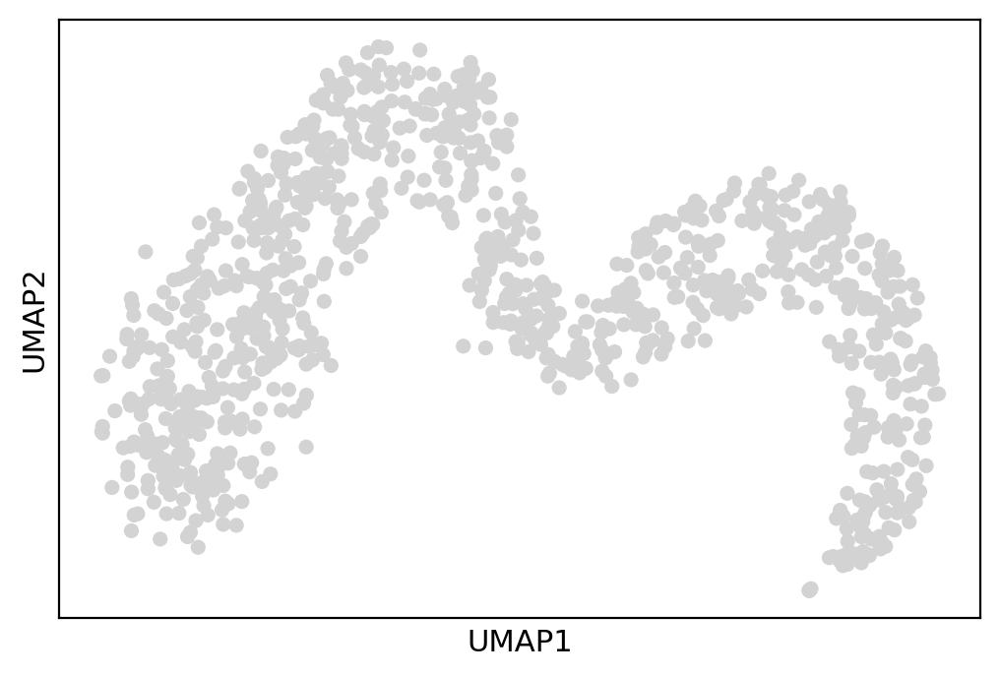

In [15]:
#preprocess
import scanpy as sc
import scvelo as scv
raw_data_path='/data1/zzhou/pseudotime/scPN/data/oligo_lite.h5ad'
adata=sc.read(raw_data_path,sparse=True)
import numpy as np
np.bool=np.bool_
np.int=np.int_
np.object = object
import scvelo as scv
import scanpy as sc
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo')  # for beautified visualization
scv.set_figure_params()

scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=1000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
adata_1000=sc.pp.subsample(adata, fraction=None, n_obs=1000, random_state=0, copy=True)
sc.tl.leiden(adata_1000, resolution=0.1)
sc.pl.umap(adata_1000)
adata_1000.write('/data1/zzhou/pseudotime/scPN/data/oligo_lite_1000.h5ad')
#add gene matrix
data_path='/data1/zzhou/pseudotime/scPN/data/oligo_lite_1000.h5ad'
gene_path='/data1/zzhou/pseudotime/scPN/data/ChEA_2016.txt'
adata=sc.read(data_path)
gene_names = list(adata.var_names)
target_idx=np.zeros((len(gene_names),len(gene_names)))
gene_names= [name.upper() for name in gene_names]
with open(gene_path, "r") as f:
     for line in f.readlines():
         line = line.strip('\n')
         line = line.split('\t')
         TF_info = line[0]
         TF_name = TF_info.split(' ')[0]
         if not TF_name in gene_names:
            continue
         targets= line[2:]
         for target in targets:
             if target in gene_names:
                target_idx[gene_names.index(TF_name),gene_names.index(target)]=1

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scvelo/plotting/utils.py:56: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scvelo/plotting/utils.py:56: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scvelo/plotting/utils.py:56: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data1/zzhou/anaconda3/envs/tensorflow/lib/python

/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scvelo/plotting/utils.py:56: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scvelo/plotting/utils.py:56: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scvelo/plotting/utils.py:56: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data1/zzhou/anaconda3/envs/tensorflow/lib/python

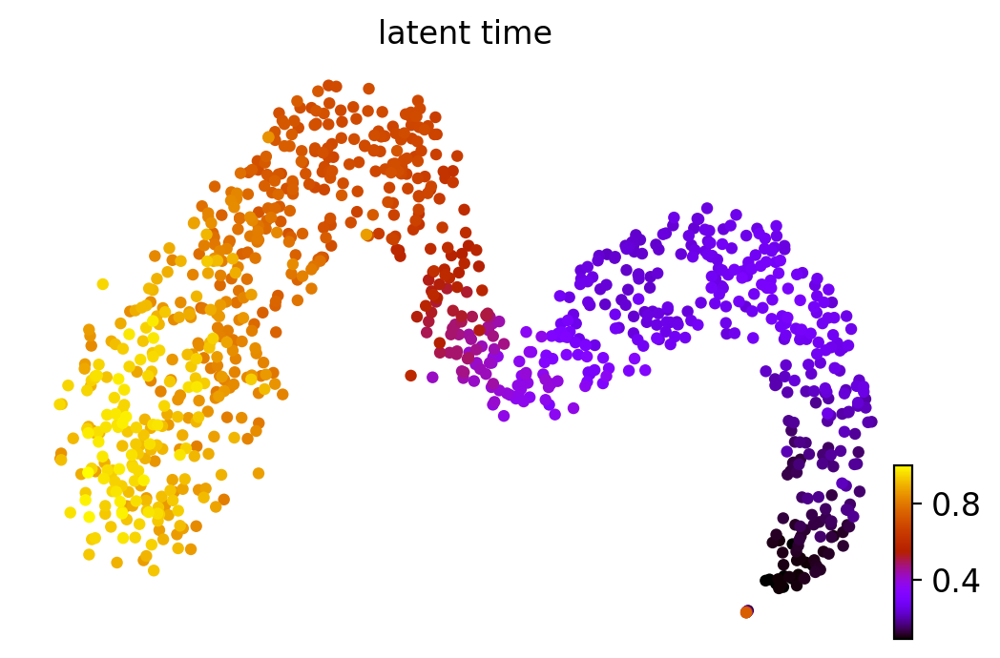

In [20]:
import numpy as np
import scvelo as scv
import scanpy as sc
import pandas as pd
neighbors=100
n_filename = '/data1/zzhou/pseudotime/scPN/data/oligo_answer'
adata=sc.read('/data1/zzhou/pseudotime/scPN/data/oligo_lite_1000.h5ad')
Answer=pd.read_csv(filename).values
n=len(Answer)
q=0
U=np.zeros(n)
for i in range(n):
    
    U[Answer[-i]-1]=1/n*q
    q+=1
adata.obs['latent_time']=U
scv.pp.neighbors(adata, n_neighbors=neighbors)
neighbor_matrix=adata.uns['neighbors']['indices']
neighbor_matrix=adata.uns['neighbors']['indices']
k=neighbors
U_KNN=np.zeros(n)
for i in range(n):
    for j in range(k):
        U_KNN[i]+=U[neighbor_matrix[i,j]]
    U_KNN[i]=U_KNN[i]/k
adata.obs['latent_time']=U_KNN/U_KNN.max()
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot',size=80, basis='X_umap',dpi=3000)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80,basis='X_umap')

Running scvelo 0.2.5 (python 3.9.12) on 2024-08-10 17:52.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
DEPRECATION: Python 3.5 reached the end of its life on September 13th, 2020. Please upgrade your Python as Python 3.5 is no longer maintained. pip 21.0 will drop support for Python 3.5 in January 2021. pip 21.0 will remove support for this functionality.
ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/an

Filtered out 22484 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Extracted 1000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


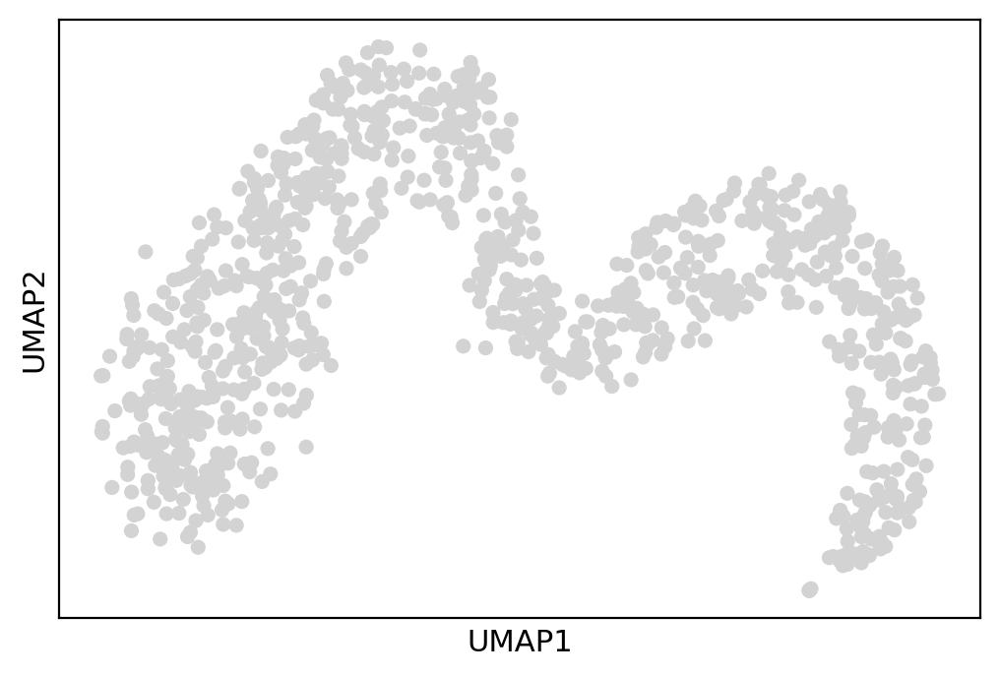

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scvelo/plotting/utils.py:56: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scvelo/plotting/utils.py:56: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scvelo/plotting/utils.py:56: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data1/zzhou/anaconda3/envs/tensorflow/lib/python

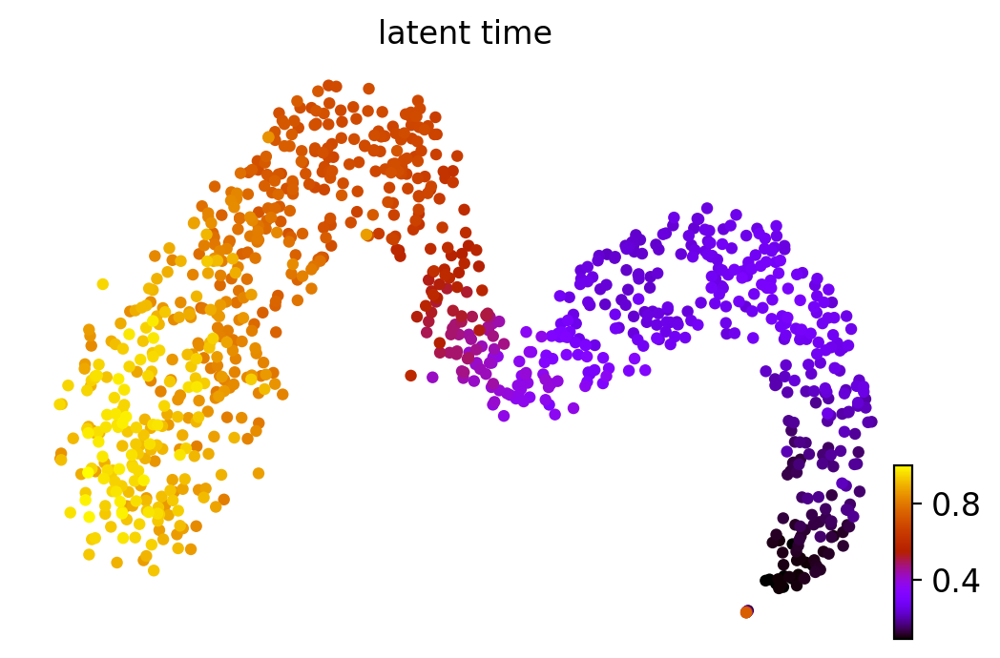

In [29]:
#preprocess
import scanpy as sc
import scvelo as scv
raw_data_path='/data1/zzhou/pseudotime/scPN/data/oligo_lite.h5ad'
adata=sc.read(raw_data_path,sparse=True)
import numpy as np
np.bool=np.bool_
np.int=np.int_
np.object = object
import scvelo as scv
import scanpy as sc
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo')  # for beautified visualization
scv.set_figure_params()

scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=1000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
adata_1000=sc.pp.subsample(adata, fraction=None, n_obs=1000, random_state=0, copy=True)
sc.tl.leiden(adata_1000, resolution=0.1)
sc.pl.umap(adata_1000)
adata_1000.write('/data1/zzhou/pseudotime/scPN/data/oligo_lite_1000.h5ad')
#add gene matrix
data_path='/data1/zzhou/pseudotime/scPN/data/oligo_lite_1000.h5ad'
gene_path='/data1/zzhou/pseudotime/scPN/data/ChEA_2016.txt'
adata=sc.read(data_path)
gene_names = list(adata.var_names)
target_idx=np.zeros((len(gene_names),len(gene_names)))
gene_names= [name.upper() for name in gene_names]
with open(gene_path, "r") as f:
     for line in f.readlines():
         line = line.strip('\n')
         line = line.split('\t')
         TF_info = line[0]
         TF_name = TF_info.split(' ')[0]
         if not TF_name in gene_names:
            continue
         targets= line[2:]
         for target in targets:
             if target in gene_names:
                target_idx[gene_names.index(TF_name),gene_names.index(target)]=1
                

neighbors=100
n_filename = '/data1/zzhou/pseudotime/scPN/data/oligo_answer.csv'
if not os.path.exists(n_filename):
    print(1)
adata=sc.read('/data1/zzhou/pseudotime/scPN/data/oligo_lite_1000.h5ad')
Answer=pd.read_csv(filename).values
n=len(Answer)
q=0
U=np.zeros(n)
for i in range(n):
    
    U[Answer[-i]-1]=1/n*q
    q+=1
adata.obs['latent_time']=U
scv.pp.neighbors(adata, n_neighbors=neighbors)
neighbor_matrix=adata.uns['neighbors']['indices']
neighbor_matrix=adata.uns['neighbors']['indices']
k=neighbors
U_KNN=np.zeros(n)
for i in range(n):
    for j in range(k):
        U_KNN[i]+=U[neighbor_matrix[i,j]]
    U_KNN[i]=U_KNN[i]/k
adata.obs['latent_time']=U_KNN/U_KNN.max()
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot',size=80, basis='X_umap')           

Running scvelo 0.2.5 (python 3.9.12) on 2024-08-10 18:10.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
DEPRECATION: Python 3.5 reached the end of its life on September 13th, 2020. Please upgrade your Python as Python 3.5 is no longer maintained. pip 21.0 will drop support for Python 3.5 in January 2021. pip 21.0 will remove support for this functionality.
ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/an

Filtered out 47456 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Extracted 1000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:22) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


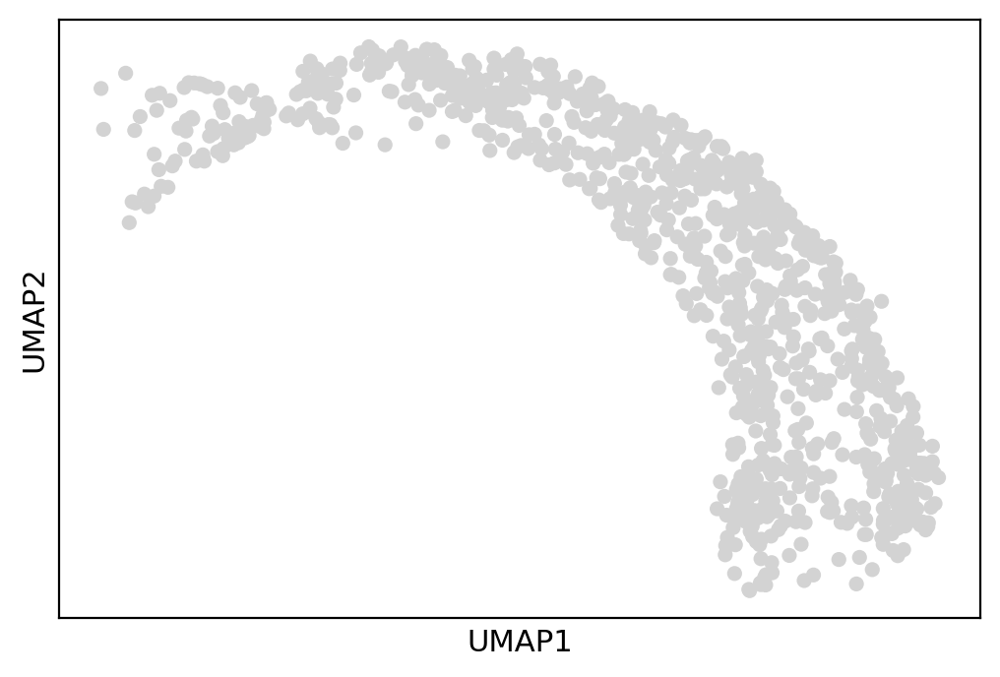

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scvelo/plotting/utils.py:56: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scvelo/plotting/utils.py:56: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/scvelo/plotting/utils.py:56: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/data1/zzhou/anaconda3/envs/tensorflow/lib/python

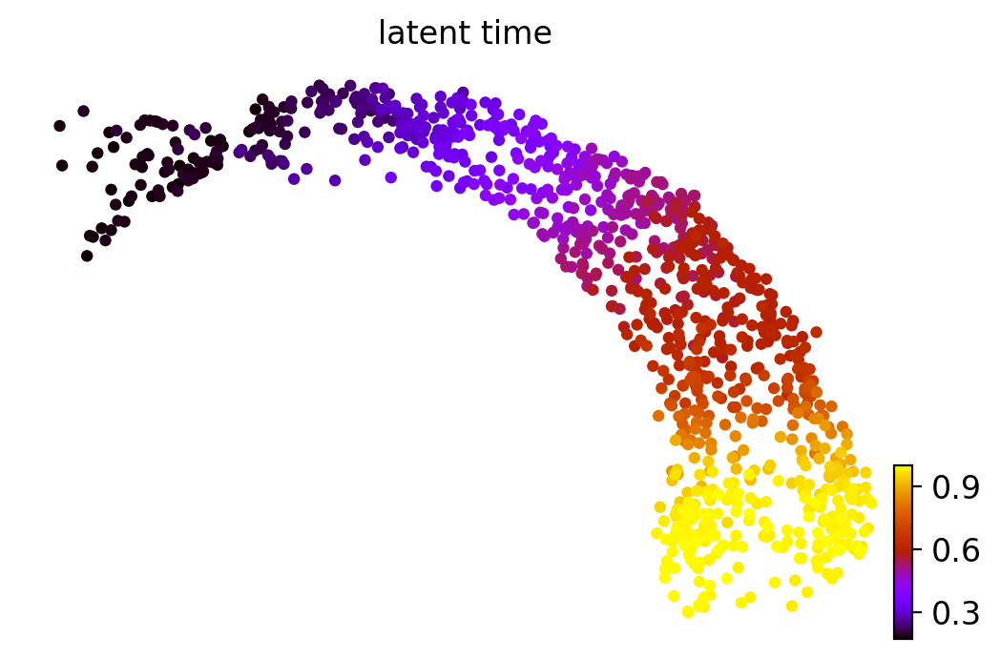

In [30]:
#preprocess
import scanpy as sc
import scvelo as scv
raw_data_path='/data1/zzhou/pseudotime/scPN/data/gastrulation.h5ad'
adata=sc.read(raw_data_path,sparse=True)
import numpy as np
np.bool=np.bool_
np.int=np.int_
np.object = object
import scvelo as scv
import scanpy as sc
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo')  # for beautified visualization
scv.set_figure_params()

scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=1000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
adata_1000=sc.pp.subsample(adata, fraction=None, n_obs=1000, random_state=0, copy=True)
sc.tl.leiden(adata_1000, resolution=0.1)
sc.pl.umap(adata_1000)
adata_1000.write('/data1/zzhou/pseudotime/scPN/data/gastrulation_1000.h5ad')
#add gene matrix
data_path='/data1/zzhou/pseudotime/scPN/data/gastrulation_1000.h5ad'
gene_path='/data1/zzhou/pseudotime/scPN/data/ChEA_2016.txt'
adata=sc.read(data_path)
gene_names = list(adata.var_names)
target_idx=np.zeros((len(gene_names),len(gene_names)))
gene_names= [name.upper() for name in gene_names]
with open(gene_path, "r") as f:
     for line in f.readlines():
         line = line.strip('\n')
         line = line.split('\t')
         TF_info = line[0]
         TF_name = TF_info.split(' ')[0]
         if not TF_name in gene_names:
            continue
         targets= line[2:]
         for target in targets:
             if target in gene_names:
                target_idx[gene_names.index(TF_name),gene_names.index(target)]=1
                

neighbors=100
n_filename = '/data1/zzhou/pseudotime/scPN/data/gastrulation_answer.csv'
def optimize_matrix_A(route,cluster='0', adata_file='/data1/zzhou/pseudotime/scPN/data/gastrulation_1000.h5ad',epochs=50000, lr=0.001):
    adata = sc.read(adata_file)
    adata_0 = adata[adata.obs['leiden'] == cluster].X
    x = adata_0.toarray()
    n, m = x.shape
    X1=torch.tensor(x,device='cuda',dtype=torch.float32)


    # 初始化需要优化的矩阵A和矩阵W
    A = np.ones((m, m))  # 根据具体需求初始化
#     target_idx = np.random.randn(m, m)  # 这个变量需要定义或从数据中获取
    W = target_idx.cpu().detach().numpy()  # 假设W矩阵和target_idx相关

    # 根据W矩阵定义掩码矩阵
    mask = np.where(W != 0, 1, 0)
    mask_gpu = torch.tensor(mask, device='cuda', dtype=torch.float64)

    # 确保矩阵A中对应W为零的位置也为零
    A *= mask
    A_gpu = torch.tensor(A, requires_grad=True, device='cuda', dtype=torch.float64)

    # 初始化优化器
    optimizer = optim.Adam([A_gpu], lr=lr)

    # 定义目标函数
    def objective_function_A(A, route):
        scalar = torch.tensor(1, device='cuda', dtype=torch.float64)
        target_idx_gpu = torch.tensor(target_idx, device='cuda', dtype=torch.float64)
        dy_gpu = torch.tensor(dy(route, x), device='cuda', dtype=torch.float64)
        Ones = torch.ones(m, m, device='cuda', dtype=torch.float64)
        W_gpu = torch.tensor(W, device='cuda', dtype=torch.float64)
        X1=torch.tensor(x,device='cuda')

#         distance_matrix=distance_matrix2.cpu().detach().numpy()
#         total_distance = 0.0
#         for i in range(len(route) - 1):
#             total_distance += distance_matrix[route[i]-1, route[i + 1]-1]
        W_reciprocal = torch.reciprocal(100 * target_idx_gpu + scalar * Ones)

        x_t = np.zeros((n, m))
        for i in range(n):
            x_t[i] = x[route[i] - 1, :]
        x_t_gpu = torch.tensor(x_t[2:n-3, :], device='cuda', dtype=torch.float64)
#         distance_matrix2=torch.cdist(X1A,X1A,p=2)
        X1A_gpu = torch.mm(x_t_gpu, A)
        W_hadamard_A_gpu = torch.mul(W_reciprocal, A)
        matrix = dy_gpu - X1A_gpu
        matrix_norm = torch.norm(matrix, p='fro')
        W_hadamard_A_norm = torch.norm(W_hadamard_A_gpu, p='fro')
        x_t_minus=torch.diff(x_t_gpu, dim=0)
        total_distance=torch.norm(torch.mm(x_t_minus,A),p='fro')
        loss = matrix_norm+W_hadamard_A_norm
        return loss

    def dy(route, x):
        m, n = x.shape
        dy1 = np.zeros((m-5, n))
        deltat = 1 / (m-1)
        for t in range(2, m - 3):
            dy1[t - 2, :] = (8 * x[route[t + 1]-1, :] - 8 * x[route[t - 1]-1, :] + x[route[t - 2]-1, :] - x[route[t + 2]-1, :]) / (12 * deltat)
        return dy1

    # 进行优化迭代
    for i in range(epochs):
        optimizer.zero_grad()  # 每次迭代前将梯度清零
        loss = objective_function_A(A_gpu, route)
        loss.backward()  # 计算梯度
        optimizer.step()  # 更新矩阵A的数值
        
        # 应用掩码，使非优化元素保持为零
        with torch.no_grad():
            A_gpu *= mask_gpu
        
        if i % 1000 == 0:  # 每1000次迭代打印一次损失
            print(f"Iteration {i}, loss: {loss.item()}")

#     print("Optimized matrix A:")
    return A_gpu.cpu().detach().numpy()

def getdistance(A,adata):
    u, s, v = np.linalg.svd(A)
    n,m=adata.shape
    X1=torch.tensor(adata,device='cuda',dtype=torch.float32)

    A=torch.tensor(A,device='cuda',dtype=torch.float32)
    X1A=torch.mm(X1, A)
# print(XA.shape,XB.shape,type(XA),type(XB))
    distance_matrix1=torch.cdist(X1, X1, p=2)
    distance_matrix2=torch.dist(X1A,X1A,p=2)
    distance_matrix=distance_matrix1+distance_matrix2/(s[0]+1)
    distance=np.array(distance_matrix.cpu())
    return distance
from python_tsp.exact import solve_tsp_dynamic_programming
from python_tsp.heuristics import solve_tsp_simulated_annealing
from python_tsp.heuristics import solve_tsp_local_search
if not os.path.exists(n_filename):
    A = np.zeros((x.shape[1], x.shape[1]))
    best_route = None
    for iteration in range(10):
        distance_matrix = getdistance(A, x)
        route, _ = solve_tsp_simulated_annealing(distance_matrix)
        route, _ = solve_tsp_local_search(distance_matrix)
        A = optimize_matrix_A(route, cluster=cluster, adata_file=adata_file)
    
    # Save the best route for the current cluster
    route_df = pd.DataFrame(route)
    route_df.to_csv('/data1/zzhou/pseudotime/scPN/data/gastrulation_answer.csv', index=False)
adata=sc.read('/data1/zzhou/pseudotime/scPN/data/gastrulation_1000.h5ad')
Answer=pd.read_csv(n_filename).values
n=len(Answer)
q=0
U=np.zeros(n)
for i in range(n):
    
    U[Answer[-i]-1]=1/n*q
    q+=1
adata.obs['latent_time']=U
scv.pp.neighbors(adata, n_neighbors=neighbors)
neighbor_matrix=adata.uns['neighbors']['indices']
neighbor_matrix=adata.uns['neighbors']['indices']
k=neighbors
U_KNN=np.zeros(n)
for i in range(n):
    for j in range(k):
        U_KNN[i]+=U[neighbor_matrix[i,j]]
    U_KNN[i]=U_KNN[i]/k
adata.obs['latent_time']=U_KNN/U_KNN.max()
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80,basis='X_umap')               

(3001, 1)

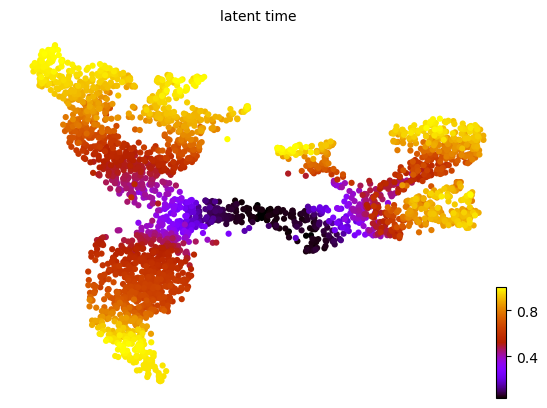

In [13]:
import scanpy as sc
import scvelo as scv
import pandas as pd
import numpy as np
adata=sc.read('/data1/zzhou/pseudotime/scPN/data/adata3000_imputed_leiden11_ID.h5ad')
Answer=pd.read_csv('/data1/zzhou/pseudotime/scPN/data/Dentateanswer/time_embedding_KNN.csv').values
adata.obs['latent_time']=Answer
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot',size=80, basis='X_umap')

各行满足大于阈值的元素个数排序结果 (前15名):
行 Sox9: 1450.0 个
行 Olig2: 1388.0 个
行 E2f1: 1330.0 个
行 Stat3: 1310.0 个
行 Egr1: 1089.0 个
行 Rest: 1005.0 个
行 Klf4: 943.0 个
行 Foxo3: 735.0 个
行 Rbpj: 666.0 个
行 Foxp1: 640.0 个
行 Jarid2: 515.0 个
行 Meis1: 502.0 个
行 Bach1: 495.0 个
行 Cux1: 479.0 个
行 Smad1: 474.0 个
行 Nr3c1: 470.0 个
行 Tcf3: 456.0 个
行 Eomes: 446.0 个
行 Foxo1: 367.0 个
行 Myb: 356.0 个
行 Sox6: 317.0 个
行 Yap1: 310.0 个
行 Bcor: 297.0 个
行 Zfp57: 282.0 个
行 Nfe2l2: 273.0 个
行 Foxp2: 269.0 个
行 Rela: 268.0 个
行 Dach1: 253.0 个
行 Neurod2: 250.0 个
行 Tfap2c: 231.0 个
行 Atf3: 231.0 个
行 Smc4: 222.0 个
行 Prdm5: 212.0 个
行 Ezh2: 202.0 个
行 Rarb: 197.0 个
行 Ebf1: 187.0 个
行 Etv1: 187.0 个
行 Klf6: 182.0 个
行 Elk3: 182.0 个
行 Tcf7l2: 167.0 个
行 Rad21: 155.0 个
行 Pax6: 154.0 个
行 Kdm5a: 140.0 个
行 Ets1: 129.0 个
行 Tdrd3: 120.0 个
行 Auts2: 86.0 个
行 Rcor2: 70.0 个
行 Elf1: 65.0 个
行 Rac3: 62.0 个
行 Nr4a2: 62.0 个
行 Notch1: 41.0 个
行 Sall1: 22.0 个
行 Chd7: 12.0 个
行 Prdm16: 9.0 个
行 Bcl11b: 7.0 个
行 Nfib: 4.0 个
行 Dhcr24: 0.0 个
行 Smc2: 0.0 个
行 Grik3: 0.0 个
行 Tg

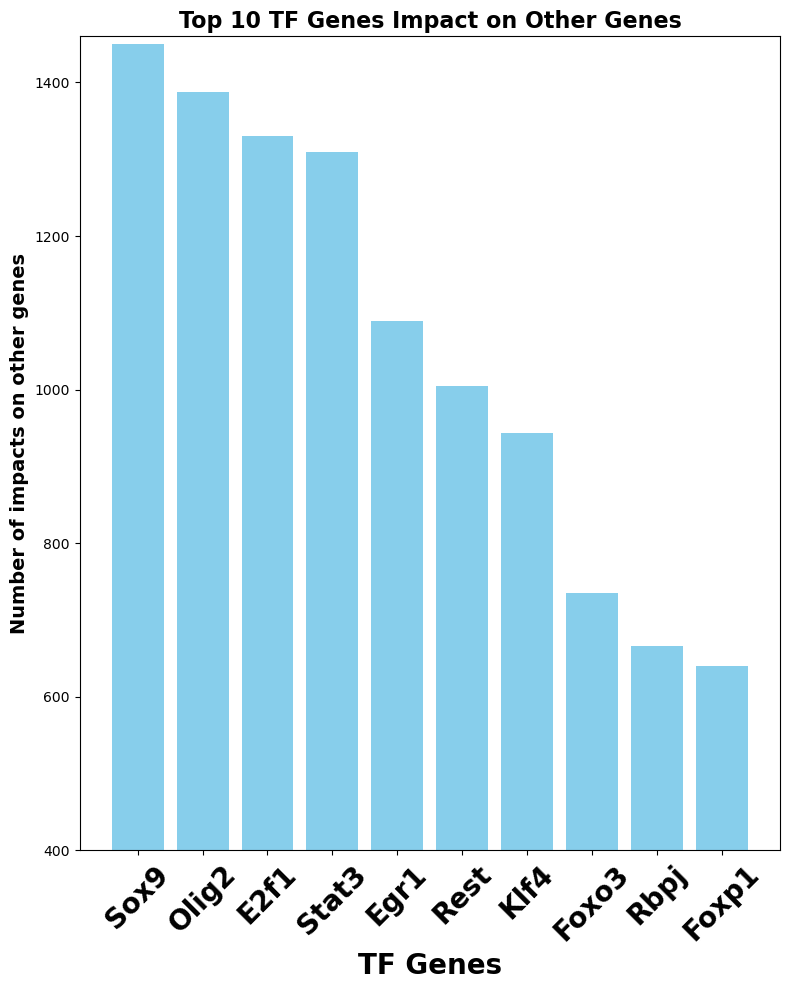

In [18]:
import numpy as np
from scipy.sparse import csr_matrix
import numpy as np
A_0=np.loadtxt("/data1/zzhou/pseudotime/scPN/data/Dentateanswer/adata_0_connection.csv",delimiter=",")
A_1=np.loadtxt("/data1/zzhou/pseudotime/scPN/data/Dentateanswer/adata_1_connection.csv",delimiter=",")
A_2=np.loadtxt("/data1/zzhou/pseudotime/scPN/data/Dentateanswer/adata_2_connection.csv",delimiter=",")
A_3=np.loadtxt("/data1/zzhou/pseudotime/scPN/data/Dentateanswer/adata_3_connection.csv",delimiter=",")
A_4=np.loadtxt("/data1/zzhou/pseudotime/scPN/data/Dentateanswer/adata_4_connection.csv",delimiter=",")
A_5=np.loadtxt("/data1/zzhou/pseudotime/scPN/data/Dentateanswer/adata_5_connection.csv",delimiter=",")
A_6=np.loadtxt("/data1/zzhou/pseudotime/scPN/data/Dentateanswer/adata_6_connection.csv",delimiter=",")
A_7=np.loadtxt("/data1/zzhou/pseudotime/scPN/data/Dentateanswer/adata_7_connection.csv",delimiter=",")

# 定义更多的矩阵 A2, A3, ... A6
adata=sc.read('/data1/zzhou/pseudotime/scPN/data/adata3000_imputed_leiden11_ID.h5ad')
# 列出所有矩阵
matrices = [A_0, A_1, A_2, A_3, A_4, A_5, A_6, A_7]  # 你可以添加更多的矩阵 A2, A3, ... A6

# 假设 adata.var_names 是一个包含列名称的列表
# 设置阈值
threshold = 0.85

def normalize_matrix(matrix):
    """对矩阵的每一列进行归一化，使得每一列的绝对值最大的元素变为1"""
    abs_matrix = np.abs(matrix)
    max_elements = abs_matrix.max(axis=0)
    max_elements[max_elements == 0] = 1  # 防止除以0的情况
    normalized_matrix = matrix / max_elements[None, :]
    return normalized_matrix

def count_large_elements(matrix, threshold):
    """计算每行中满足大于阈值的元素个数"""
    sparse_matrix = csr_matrix(matrix)
    rows, cols = sparse_matrix.nonzero()
    data = sparse_matrix.data
    
    large_elements_count = np.zeros(sparse_matrix.shape[0])  # 计算行的元素个数
    
    for i, val in enumerate(data):
        if abs(val) > threshold:
            large_elements_count[rows[i]] += 1  # 对行的元素进行计数
    
    return large_elements_count

# 归一化矩阵并计算每行中满足大于阈值的元素个数
total_large_elements_count = np.zeros(matrices[0].shape[0])

for matrix in matrices:
    normalized_matrix = normalize_matrix(matrix)
    large_elements_count = count_large_elements(normalized_matrix, threshold)
    total_large_elements_count += large_elements_count

# 对总的计数结果进行排序
sorted_indices = np.argsort(-total_large_elements_count)[:100]
sorted_counts = total_large_elements_count[sorted_indices]
sorted_var_names = [adata.var_names[i] for i in sorted_indices]

# 打印结果
print("各行满足大于阈值的元素个数排序结果 (前15名):")
for i, count in enumerate(sorted_counts):
    print(f"行 {sorted_var_names[i]}: {count} 个")
import matplotlib.pyplot as plt

# 假设 sorted_var_names 和 sorted_counts 是已经排好序的变量名和对应的影响个数
top_genes = sorted_var_names[:10]
impact_counts = sorted_counts[:10]

plt.figure(figsize=(8, 10))  # 调整图的大小
plt.bar(top_genes, impact_counts, color='skyblue')

# 设置x轴标签为黑体并加大字体
plt.xlabel('TF Genes', fontsize=20, fontweight='bold')  # x轴标签改为英文
# 设置y轴标签并加大字体
plt.ylabel('Number of impacts on other genes', fontsize=14, fontweight='bold')  # y轴标签改为英文
# 设置标题并加大字体
plt.title('Top 10 TF Genes Impact on Other Genes', fontsize=16, fontweight='bold')  # 标题改为英文

# 旋转x轴标签，使其更易读
plt.xticks(rotation=45, fontsize=20, fontweight='bold')

# 调整y轴范围，使其从400开始
plt.ylim(400, max(impact_counts) + 10)

plt.tight_layout()  # 调整布局，避免标签被截断
plt.show()


In [ ]:
#contrast
# import velovi as vv
import scanpy as sc
import scvelo as scv

adata=sc.read('adata3000_imputed_leiden11_ID.h5ad')

In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv
import torch
from velovi import preprocess_data, VELOVI

import matplotlib.pyplot as plt
import seaborn as sns
scv.pp.filter_and_normalize(adata, min_shared_counts=30, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
VELOVI.setup_anndata(adata, spliced_layer="Ms", unspliced_layer="Mu")
vae = VELOVI(adata)
vae.train()
def add_velovi_outputs_to_adata(adata, vae):
    latent_time = vae.get_latent_time(n_samples=25)
    velocities = vae.get_velocity(n_samples=25, velo_statistic="mean")

    t = latent_time
    scaling = 20 / t.max(0)

    adata.layers["velocity"] = velocities / scaling
    adata.layers["latent_time_velovi"] = latent_time

    adata.var["fit_alpha"] = vae.get_rates()["alpha"] / scaling
    adata.var["fit_beta"] = vae.get_rates()["beta"] / scaling
    adata.var["fit_gamma"] = vae.get_rates()["gamma"] / scaling
    adata.var["fit_t_"] = (
        torch.nn.functional.softplus(vae.module.switch_time_unconstr)
        .detach()
        .cpu()
        .numpy()
    ) * scaling
    adata.layers["fit_t"] = latent_time.values * scaling[np.newaxis, :]
    adata.var['fit_scaling'] = 1.0

add_velovi_outputs_to_adata(adata, vae)
scv.pl.velocity_embedding_stream(adata, basis='umap')
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

In [ ]:
#preprocess
import scanpy as sc
import scvelo as scv

import numpy as np
np.bool=np.bool_
np.int=np.int_
np.object = object
import scvelo as scv
import scanpy as sc
import pandas as pd
neighbors=30
adata=sc.read('/data1/zzhou/pseudotime/scPN/data/gastrulation_1000.h5ad')
n_filename = '/data1/zzhou/pseudotime/scPN/data/gastrulation_answer.csv'
Answer=pd.read_csv(n_filename).values
n=len(Answer)
q=0
U=np.zeros(n)
for i in range(n):
    
    U[Answer[-i]-1]=1/n*q
    q+=1
adata.obs['latent_time']=U
scv.pp.neighbors(adata, n_neighbors=neighbors)
neighbor_matrix=adata.uns['neighbors']['indices']
neighbor_matrix=adata.uns['neighbors']['indices']
k=neighbors
U_KNN=np.zeros(n)
for i in range(n):
    for j in range(k):
        U_KNN[i]+=U[neighbor_matrix[i,j]]
    U_KNN[i]=U_KNN[i]/k
adata.obs['latent_time']=U_KNN/U_KNN.max()
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80,basis='X_umap')
final_time=list(adata.obs['latent_time'])
sorted_indices = np.argsort(final_time)

In [ ]:
adata_X=adata.X.toarray()
# adata_X=adata_X[:,k_smallest_indices]
n,m=adata_X.shape
velocity=np.zeros((n,m))
for i in range(n-100):
    velocity[sorted_indices[i],:]=(adata_X[sorted_indices[i+100],:]-adata_X[sorted_indices[i],:])

adata.layers['velocity']=velocity
gene_total_loss=np.zeros(m)
k=500
for i in range(n-1):
    for j in range(m):
        gene_total_loss[j]+=np.linalg.norm(adata_X[i+1,j]-adata_X[i,j])
sorted_indices_genes = np.argsort(gene_total_loss)
k_smallest_indices = sorted_indices_genes[:k]
from anndata import AnnData
adata_X=adata.X.toarray()
adata_X_sub=adata_X[:,k_smallest_indices]
adata_sub= AnnData(adata_X_sub)
adata_sub.var_names=adata.var_names[k_smallest_indices]
adata_sub.layers['velocity']=adata.layers['velocity'][:,k_smallest_indices]
adata_sub.obs=adata.obs
adata_sub.obs['sample']=adata.obs['sample']
adata_sub.obs['latent_time']=adata.obs['latent_time']
adata_sub.layers['Ms']=adata.layers['Ms'][:,k_smallest_indices]
adata_sub.layers['Mu']=adata.layers['Mu'][:,k_smallest_indices]
adata_sub.layers['spliced']=adata.layers['spliced'][:,k_smallest_indices]
adata_sub.layers['unspliced']=adata.layers['unspliced'][:,k_smallest_indices]
adata_sub.obsm['X_umap']=adata.obsm['X_umap']
adata_sub.uns['neighbors']=adata.uns['neighbors']
adata_sub.obsp['distances']=adata.obsp['distances']
adata_sub.obsp['connectivities']=adata.obsp['connectivities']
scv.tl.velocity_graph(adata_sub)

scv.pl.velocity_embedding_grid(
    adata_sub,


    color='latent_time',
    basis='umap',
    density=0.8,
    min_mass=0.5,
    smooth=1.2,
    title='Velocity Field on UMAP',

    show=True
)
scv.pl.velocity_embedding_stream(
    adata_sub,


    color='latent_time',
    basis='umap',
    density=1.0,
    min_mass=1.2,
    smooth=1.2,
    title='Velocity Field on UMAP',

    show=True
)


In [1]:
#preprocess
import scanpy as sc
import scvelo as scv

import numpy as np
np.bool=np.bool_
np.int=np.int_
np.object = object
import scvelo as scv
import scanpy as sc
import pandas as pd

/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/data1/zzhou/anaconda3/envs/tensorflow/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.4' currently installed).
  from pandas.core import (


In [2]:
data_path='/data1/zzhou/pseudotime/scPN/data/adata3000_imputed_leiden11_ID.h5ad'
adata=sc.read(data_path)

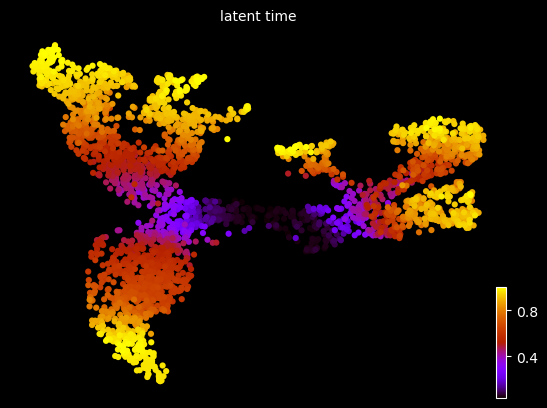

In [3]:
adata=sc.read('/data1/zzhou/pseudotime/scPN/data/adata3000_imputed_leiden11_ID.h5ad')
Answer=pd.read_csv('/data1/zzhou/pseudotime/scPN/data/Dentateanswer/time_embedding_KNN.csv').values
n=len(Answer)
adata.obs['latent_time']=Answer
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot',size=80, basis='X_umap')

In [4]:
def find_closest_larger_index(my_list, value):

    larger_elements = [(i, num) for i, num in enumerate(my_list) if num > value]
    
    if not larger_elements:
        return None 

    closest_index, closest_value = min(larger_elements, key=lambda x: x[1] - value)
    return closest_index
def find_kth_larger_index(my_list, x, k):

    larger_elements_with_index = [(num, idx) for idx, num in enumerate(my_list) if num > x]
    

    if len(larger_elements_with_index) < k:
        return None  
    

    larger_elements_with_index.sort(key=lambda pair: pair[0])
    

    return larger_elements_with_index[k - 1][1]


n,m=adata.X.shape
velocity=np.zeros((n,m))
for i in range(3000):
    leiden_mask=int(adata[i].obs['leiden'].to_numpy())
    if leiden_mask in [0,1,2,3,4,5,6,7]:
        # sum+=1
        if leiden_mask==0:
            k=150
        else:
            k=30
        adata_tmp=adata[adata.obs['leiden']==str(leiden_mask)]
        final_time_tmp=list(adata_tmp.obs['latent_time'])
        # sorted_indices_tmp = np.argsort(final_time_tmp)
        index_tmp=find_kth_larger_index(final_time_tmp, adata[i].obs['latent_time'].values,k)
        # connection_tmp=pd.read_csv(f'/data1/zzhou/pseudotime/scPN/data/Dentateanswer/adata_{leiden_mask}_connection.csv',header=None)
        if index_tmp!=None:
            velocity[i,:]=adata_tmp.X.toarray()[index_tmp,:]-adata.X.toarray()[i,:]

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing velocity graph (using 1/40 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:20) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


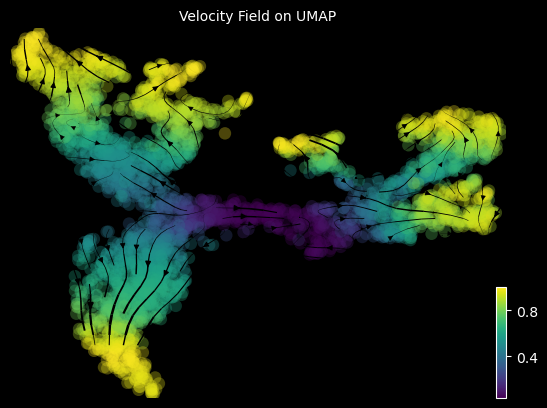

In [6]:
neighbors=50
adata.layers['velocity']=velocity
scv.pp.neighbors(adata, n_neighbors=neighbors)
scv.tl.velocity_graph(adata)

scv.pl.velocity_embedding_stream(
    adata,


    color='latent_time',
    basis='umap',
    density=1.2,
    min_mass=2.0,
    cutoff_perc=0.95,
    smooth=0.8,
    # adjust_for_stream=False,
    arrow_size=0.8,
    title='Velocity Field on UMAP',

    show=True
)